# House Price Prediction

## Exclusive Summary

In this project, I employed a variety of machine learning and deep learning techniques to predict house prices. The methodologies included linear regression, regularization techniques (such as Ridge and Lasso regression), decision trees, random forests, and neural networks.

To start, I built and fine-tuned these models using a comprehensive dataset of Illinois house prices, leveraging feature engineering to improve model performance. Key features included square footage, number of bedrooms and bathrooms, and neighborhood characteristics. I performed extensive preprocessing, including handling missing data, normalizing numerical features, and encoding categorical variables.

For model evaluation and to ensure the robustness of my predictions, I implemented cross-validation using house price data from Wisconsin. This step involved splitting the Wisconsin dataset into training and test sets, ensuring the models generalized well to unseen data.

The project culminated in a comparative analysis of the model performances, highlighting the strengths and weaknesses of each approach. The neural network model, in particular, demonstrated superior performance due to its ability to capture complex nonlinear relationships within the data.

Overall, this project showcased the practical application of diverse machine learning techniques in real estate price prediction, emphasizing model accuracy and generalizability across different datasets.

In [65]:
# Import pachages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import seaborn as sns
import plotly.express as px

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

import json

## Dataset Description

**The datasets used in this analysis are IL_housing_price.csv and WI_housing_price.csv, covering property sales in Illinois and Wisconsin from January 1, 2017, to April 1, 2024. Each dataset contains the following columns:**

**property_url:** URL of the property listing.

**style:** Style of the house.

**beds:** Number of bedrooms.

**full_baths:** Number of full bathrooms.

**half_baths:** Number of half bathrooms.

**sqft:** Total square footage of the house.

**year_built:** Year the house was built.

**sold_price:** Sale price of the house (target variable).

**lot_sqft:** Lot size in square feet.

**latitude and longitude:** Geographic coordinates of the property.

**county:** County where the property is located.

**stories:** Number of stories in the house.

**parking_garage:** Number of parking garages.

## Exploratory Data Analysis - IL Housing Price

In [2]:
# Import data
il_housing = pd.read_csv('IL_housing_price.csv')
display(il_housing)

,property_url,style,beds,full_baths,half_baths,sqft,year_built,sold_price,lot_sqft,latitude,longitude,county,stories,parking_garage
0,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,4,2,1,2930,1991,337000,26136,42.304041,-88.450051,McHenry,2,3
1,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,3,1,0,1040,1956,62500,0,41.594131,-87.690837,Cook,1,2
2,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,3,1,1,1107,1960,174000,0,42.093726,-88.682643,DeKalb,1,2
3,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,5,2,0,1997,1913,166501,3720,41.906657,-87.766165,Cook,2,2
4,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,2,1,0,1029,1940,113000,7200,38.887778,-90.131944,Madison,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8133,https://www.realtor.com/realestateandhomes-det...,CONDO_TOWNHOME_ROWHOME_COOP,2,2,0,800,1972,34000,0,41.552216,-87.538907,Cook,3,1
8134,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,4,3,0,2039,1972,235500,218671,42.375782,-88.929856,Boone,1,2
8135,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,5,3,0,4119,2007,357000,14375,41.653263,-88.256486,Will,2,3
8136,https://www.realtor.com/realestateandhomes-det...,SINGLE_FAMILY,3,1,0,1210,1933,18500,9148,39.278962,-89.886164,Macoupin,1,0


In [7]:
# Check data information
print(il_housing.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8138 entries, 0 to 8137
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   property_url    8138 non-null   object 
 1   style           8138 non-null   object 
 2   beds            8138 non-null   int64  
 3   full_baths      8138 non-null   int64  
 4   half_baths      8138 non-null   int64  
 5   sqft            8138 non-null   int64  
 6   year_built      8138 non-null   int64  
 7   sold_price      8138 non-null   int64  
 8   lot_sqft        8138 non-null   int64  
 9   latitude        8138 non-null   float64
 10  longitude       8138 non-null   float64
 11  county          8138 non-null   object 
 12  stories         8138 non-null   int64  
 13  parking_garage  8138 non-null   int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 890.2+ KB
None


In [8]:
# Check categorical column
print(il_housing['style'].value_counts())
print(il_housing['county'].value_counts())

style
SINGLE_FAMILY                  6946
CONDOS                          593
CONDO_TOWNHOME_ROWHOME_COOP     294
TOWNHOMES                       195
MULTI_FAMILY                     55
MOBILE                           52
LAND                              3
Name: count, dtype: int64
county
Cook         3033
Lake          673
DuPage        425
Madison       419
Will          403
             ... 
White           1
McDonough       1
Johnson         1
Massac          1
Calhoun         1
Name: count, Length: 93, dtype: int64


In [9]:
# Check numerical columns
il_housing.describe()

,beds,full_baths,half_baths,sqft,year_built,sold_price,lot_sqft,latitude,longitude,stories,parking_garage
count,8138.000000,8138.000000,8138.000000,8.138000e+03,8138.000000,8.138000e+03,8138.000000,8138.000000,8138.000000,8138.000000,8138.000000
mean,3.074711,1.692553,0.378471,3.043717e+03,1957.659253,1.545589e+05,14986.481445,41.246550,-88.369205,1.727943,1.517818
std,0.967239,0.830680,0.544483,1.231534e+05,36.205713,1.511824e+05,40232.527629,1.199510,0.822731,2.965113,1.062153
min,0.000000,0.000000,0.000000,5.000000e+01,1000.000000,5.000000e+02,0.000000,30.268630,-95.557483,0.000000,0.000000
25%,2.000000,1.000000,0.000000,1.088000e+03,1935.000000,4.850000e+04,3724.000000,41.115289,-88.832031,1.000000,1.000000
50%,3.000000,2.000000,0.000000,1.400000e+03,1960.000000,1.184950e+05,7214.500000,41.717721,-88.068024,2.000000,2.000000
75%,4.000000,2.000000,1.000000,1.943000e+03,1986.000000,2.139855e+05,11398.750000,42.003623,-87.743022,2.000000,2.000000
max,8.000000,8.000000,9.000000,1.111111e+07,2019.000000,2.225000e+06,1000000.000000,42.497179,-87.525750,95.000000,20.000000


During the initial investigation, no spelling errors and obvious outliers were found in the database.

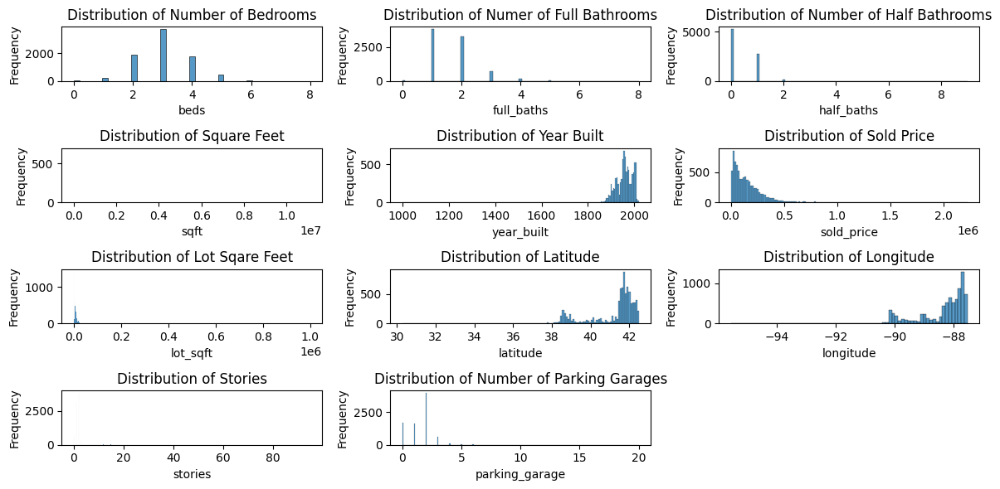

In [10]:
# Check distribution for numerical data
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 6))

numerical_columns = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage']
title = ['Number of Bedrooms', 'Numer of Full Bathrooms', 'Number of Half Bathrooms', 'Square Feet', 'Year Built', 'Sold Price',
       'Lot Sqare Feet', 'Latitude', 'Longitude', 'Stories', 'Number of Parking Garages']

for i, columns in enumerate(numerical_columns):
  sns.histplot(data=il_housing, x=columns, ax = axs[i//3, i%3])
  axs[i//3, i%3].set_title(f'Distribution of {title[i]}')
  axs[i//3, i%3].set_ylabel('Frequency')

axs[-1, -1].axis('off')
plt.tight_layout()
plt.show()

The histogram doesn’t give us a good idea of ​​the distribution, so let’s try a set of box plot.

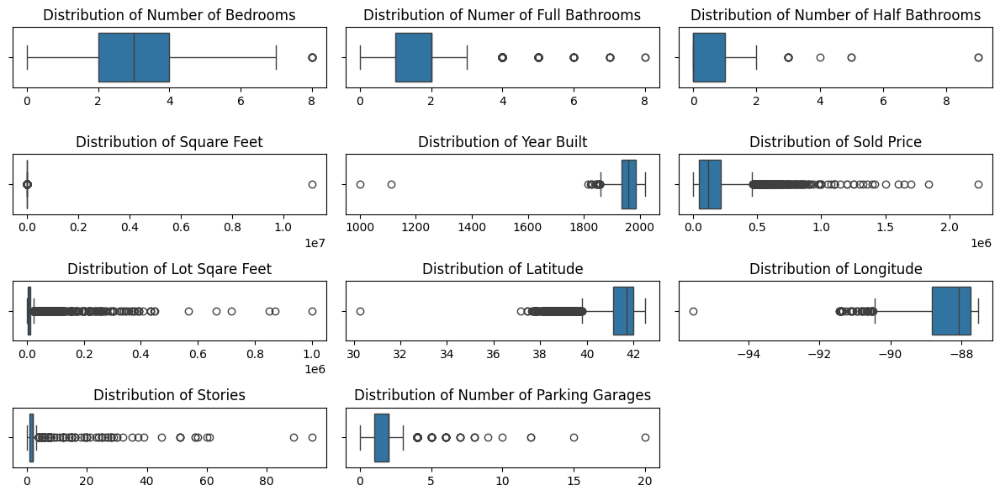

In [11]:
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 6))

numerical_columns = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage']
title = ['Number of Bedrooms', 'Numer of Full Bathrooms', 'Number of Half Bathrooms', 'Square Feet', 'Year Built', 'Sold Price',
       'Lot Sqare Feet', 'Latitude', 'Longitude', 'Stories', 'Number of Parking Garages']

for i, columns in enumerate(numerical_columns):
  sns.boxplot(data=il_housing, x=columns, ax = axs[i//3, i%3])
  axs[i//3, i%3].set_title(f'Distribution of {title[i]}')
  axs[i//3, i%3].set_xlabel("")

axs[-1, -1].axis('off')
plt.tight_layout()
plt.show()

Obviously this set of data contains many outliers, and I plan to use the IQR method to remove them.

In [12]:
iqr_list = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'stories', 'parking_garage']

# Define IQR to modify outliner
Q1 = il_housing[iqr_list].quantile(0.25)
Q3 = il_housing[iqr_list].quantile(0.75)
IQR = Q3 - Q1

# Set lower bound and uper bond
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

il_housing[iqr_list] = il_housing[iqr_list].clip(lower=lower_bound, upper=upper_bound, axis=1)

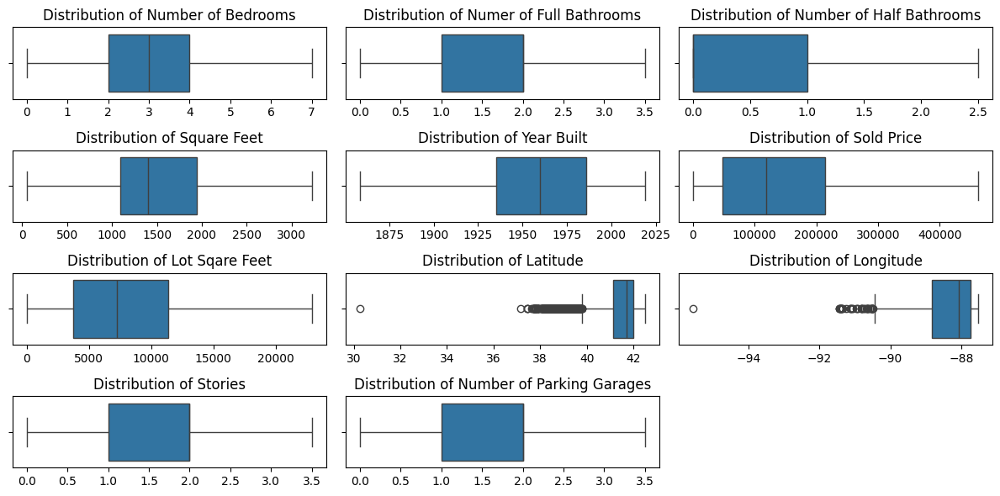

In [13]:
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(12, 6))

numerical_columns = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage']
title = ['Number of Bedrooms', 'Numer of Full Bathrooms', 'Number of Half Bathrooms', 'Square Feet', 'Year Built', 'Sold Price',
       'Lot Sqare Feet', 'Latitude', 'Longitude', 'Stories', 'Number of Parking Garages']

for i, columns in enumerate(numerical_columns):
  sns.boxplot(data=il_housing, x=columns, ax = axs[i//3, i%3])
  axs[i//3, i%3].set_title(f'Distribution of {title[i]}')
  axs[i//3, i%3].set_xlabel("")

axs[-1, -1].axis('off')
plt.tight_layout()
plt.show()

In [68]:
il_map = pd.read_csv('IL_housing_price.csv')

# Since we know that there are some outliner in IL data set, let's solve it again by using IQR.
# Think about if we really want to modify sold price.
iqr_list = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'stories', 'parking_garage']

# Define IQR to modify outliner
Q1 = il_map[iqr_list].quantile(0.25)
Q3 = il_map[iqr_list].quantile(0.75)
IQR = Q3 - Q1

# Set lower bound and uper bond
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

il_map[iqr_list] = il_map[iqr_list].clip(lower=lower_bound, upper=upper_bound, axis=1)

il_true_avg = il_map.groupby('county')['sold_price'].mean().reset_index()

print("True Sold Price Distribution")
# Load the GeoJSON file containing geographic data for Illinois counties
with open('illinois-counties.geojson') as f:
    geojson_data = json.load(f)

# Assuming df_avg is a DataFrame that includes the average housing price for each county in Illinois
fig = px.choropleth(
    il_true_avg,  # DataFrame containing the average sold price for each county
    geojson=geojson_data,  # GeoJSON data
    locations="county",
    featureidkey="properties.name",  # Path in GeoJSON to match with locations
    color="sold_price",  # Column in df_avg used to determine the color of the counties
    color_continuous_scale="Viridis",  # Color scale for the Choropleth map
    scope="usa",
    labels={"sold_price": "Average Sold Price"},  # Label for the color scale
)

# Update layout to minimize white space around the map
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
# Ensure that the map scales and centers correctly around the locations
fig.update_geos(fitbounds="locations", visible=True)
# Display the map
fig.show()

True Sold Price Distribution


Now, we can consider that the outliers are removed.

## Model Preparation

In [17]:
# Get dummpy variable
il_df = pd.get_dummies(data=il_housing, columns = ['style', 'county'], drop_first = True)

bool_columns = il_df.select_dtypes(include=bool).columns
il_df[bool_columns] = il_df[bool_columns].astype(int)

# See correlation
il_df = il_df.drop(['property_url'], axis=1)
il_df.drop(['sold_price'], axis=1).corr().style.background_gradient(cmap='coolwarm', axis=None)

In [18]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = il_df.drop(['sold_price'], axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(il_df.drop(['sold_price'], axis = 1).values, i)
                          for i in range(len(il_df.drop(['sold_price'], axis = 1).columns))]
print(vif_data)

                               feature           VIF
0                                 beds     23.712844
1                           full_baths     14.685473
2                           half_baths      2.217962
3                                 sqft     19.659846
4                           year_built   5816.239209
5                             lot_sqft      4.317379
6                             latitude  55457.186865
7                            longitude  55579.801653
8                              stories      7.580237
9                       parking_garage      5.597639
10   style_CONDO_TOWNHOME_ROWHOME_COOP      1.522681
11                          style_LAND      1.139683
12                        style_MOBILE      1.265064
13                  style_MULTI_FAMILY      1.318872
14                 style_SINGLE_FAMILY     21.676115
15                     style_TOWNHOMES      1.387913
16                         county_Bond      3.896875
17                        county_Boone      6.

VIF measures the multicollinearity between each independent variable and the other independent variables. Specifically, it is calculated by regressing one independent variable as the dependent variable on the other independent variables. If the VIF value is high, it indicates that the independent variable has high collinearity with the other independent variables, which may cause the regression model to be unstable. By identifying independent variables with high VIF values, measures can be taken, such as removing or merging variables, to improve the interpretability and stability of the model.

But, we don't care about VIFs a lot this time.

In [22]:
# Define x and Y
y = il_df['sold_price']
X = il_df.drop(['sold_price'], axis=1)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling Data
scaler = StandardScaler()

numerical_columns.remove('sold_price') # Remember to remove it

X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])

# Center mean y value
y_train = y_train - np.mean(y_train)
y_test = y_test - np.mean(y_test)

Data scaling is crucial in machine learning and deep learning for several reasons. It enhances model performance, speeds up training, and prevents features with larger values from disproportionately influencing the model. By ensuring that all features are on the same scale, scaling facilitates faster convergence of gradient descent algorithms and is particularly important for distance-based algorithms like k-nearest neighbors and support vector machines. Common scaling methods include standardization (Z-score normalization), which adjusts data to have a mean of 0 and a standard deviation of 1, and min-max scaling (normalization), which scales data to a [0, 1] range. Choosing the appropriate scaling method depends on the characteristics of the data and the specific requirements of the machine learning algorithm.

Taking the mean of the target variable y is useful for several reasons. It provides a simple baseline prediction to evaluate the performance of more complex models. In regression models, centering y around its mean can make the intercept term more interpretable, representing the average value of y when all predictors are at their mean values. Additionally, for gradient descent-based algorithms, mean-centering 
y can facilitate faster and more stable convergence by balancing the gradients. This step also removes potential biases, aligning the data with the assumptions of various statistical techniques and leading to more accurate results. Overall, taking and potentially centering the mean of y enhances baseline evaluation, model interpretability, convergence, and statistical accuracy.

Models like Ridge and LASSO assume the input features are standardized (mean 0, std. dev. 1) and the target values are centered (mean 0). If we do not do this, we might get some unpredictable results since we violate the assumption of the models!

## Modeling

#### Linear Regression

In [24]:
#Add a constant to the X's:
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test)

# Fit a linear regression model to the training data
lm = sm.OLS(y_train, X_train_const).fit()
print(lm.summary())

# Use the trained model to predict the prices for the testing data. Call the vector of predicted prices Y_pred
y_pred = lm.predict(X_test_const)
lm_mse = mean_squared_error(y_test, y_pred)
print("MSE of Linear Model:", lm_mse)

                            OLS Regression Results                            
Dep. Variable:             sold_price   R-squared:                       0.685
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                     130.1
Date:                Fri, 19 Jul 2024   Prob (F-statistic):               0.00
Time:                        18:56:48   Log-Likelihood:                -81587.
No. Observations:                6510   AIC:                         1.634e+05
Df Residuals:                    6402   BIC:                         1.641e+05
Df Model:                         107                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

**The OLS regression results for predicting the sold_price of houses provide several key insights:**

*Model Performance:* The R-squared value is 0.685, indicating that approximately 68.5% of the variance in house prices is explained by the model. The adjusted R-squared is 0.680, which accounts for the number of predictors and indicates a good model fit.

*Significant Predictors:* Several predictors are highly significant (p < 0.05):

beds: The number of bedrooms has a negative coefficient (-6635.5017), suggesting that an increase in the number of bedrooms is associated with a decrease in the house price.
full_baths and half_baths: Both have positive coefficients (2.621e+04 and 1.119e+04, respectively), indicating that more bathrooms contribute to a higher house price.
sqft: Square footage is positively associated with house price (coefficient = 3.716e+04).
year_built: Newer houses have higher prices (coefficient = 1.771e+04).
latitude and longitude: The location (latitude with a positive coefficient and longitude with a negative coefficient) significantly affects house prices.
parking_garage: Availability of a parking garage significantly increases house prices (coefficient = 8769.1075).
Marginal Predictors: The lot_sqft predictor is marginally significant (p = 0.078), with a positive coefficient, suggesting that larger lots may increase house prices, but the effect is not as strong.

*Non-significant Predictors:* The stories predictor is not statistically significant (p = 0.062), indicating that the number of stories does not have a strong independent effect on house prices in this model.

*Intercept:* The negative intercept (-1.881e+05) represents the baseline effect when all predictors are zero, which is less interpretable on its own.

*Multicollinearity:* The note about the smallest eigenvalue (5.24e-30) suggests potential multicollinearity issues, which could affect the stability and interpretation of the coefficients. This might require further investigation, such as using variance inflation factor (VIF) analysis we mentioned before or regularization techniques we will use later.

The Mean Squared Error (MSE) of the linear model is 4263944795.698746. This value indicates the average squared difference between the observed actual outcomes and the outcomes predicted by the model. A lower MSE value generally indicates a better fit of the model to the data.

In [32]:
# Residual Plot
# Compute the residuals
results = pd.DataFrame()
results['Price'] = y_train
results['prediction_lm'] = lm.fittedvalues
results['residual_lm'] = lm.resid

fig = px.scatter(
    results, x='prediction_lm', y='residual_lm', height = 350,
    labels={'prediction_lm':'Predicted values', 'residual_lm':'Residuals'}
)
fig.show()

**The residuals plot shows the residuals (errors) on the y-axis and the predicted values on the x-axis for the house price prediction model. Here are some insights from the plot:**

*Heteroscedasticity:* The plot indicates heteroscedasticity, where the spread of residuals increases with the predicted values. This suggests that the model's errors are not constant across all levels of the predicted values, which can affect the reliability of confidence intervals and hypothesis tests.

*Outliers:* There are a few extreme outliers, particularly noticeable on the far left and far right of the plot. These points may indicate data entry errors, unusual properties, or leverage points that disproportionately influence the model.

*Non-linearity:* The residuals are not randomly scattered around the horizontal axis (residual = 0), indicating potential non-linear relationships between the predictors and the target variable that the linear model cannot capture. This suggests that a non-linear model might better fit the data.

*Model Improvement:*

    1. Applying transformations to the target variable (e.g., logarithmic transformation).

    2. Including interaction terms or polynomial features.

    3. Exploring non-linear models like decision trees, random forests, or neural networks to capture the complex relationships in the data.

In summary, the residuals plot reveals heteroscedasticity, outliers, and non-linearity, suggesting that the current linear model may not be the best fit for the data and that more complex modeling approaches should be considered.

### Lasso

In [26]:
def print_coefficients(model, features):
    """
    This function takes in a model column and a features column.
    And prints the coefficient along with its feature name.
    """
    feats = list(zip(model.coef_, features))
    print(*feats, sep = "\n")

all_features = []
for i in X.columns:
  all_features.append(i)

In [27]:
# By using gvsearch to find best lasso
parameters = {
    'alpha': np.logspace(1, 7, num=7),
}

lasso = Lasso()
gs = GridSearchCV(lasso, parameters, cv=4)
gs.fit(X_train, y_train)
print(gs.best_params_)

# Run best lasso
best_lasso = gs.best_estimator_

# Use the trained model to predict the prices for the testing data. Call the vector of predicted prices Y_pred
y_pred = best_lasso.predict(X_test)
lasso_mse = mean_squared_error(y_test, y_pred)
print_coefficients(best_lasso, all_features)
print("MSE of Lasso:", lasso_mse)

c:\Users\Weihan Weng\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.164e+11, tolerance: 7.003e+09



{'alpha': 10.0}
(-6793.592658920685, 'beds')
(26663.316108512194, 'full_baths')
(11364.76188412574, 'half_baths')
(37336.83332732954, 'sqft')
(17913.122003920467, 'year_built')
(2309.0605224349256, 'lot_sqft')
(98577.97391781516, 'latitude')
(-46429.42847744038, 'longitude')
(1953.8704179391825, 'stories')
(8616.382662678234, 'parking_garage')
(-29412.116024083432, 'style_CONDO_TOWNHOME_ROWHOME_COOP')
(0.0, 'style_LAND')
(-49267.37837045325, 'style_MOBILE')
(-8392.62814696606, 'style_MULTI_FAMILY')
(11677.643090752656, 'style_SINGLE_FAMILY')
(13445.482309072484, 'style_TOWNHOMES')
(70409.5357681196, 'county_Bond')
(-127806.92929495925, 'county_Boone')
(-81574.16926117212, 'county_Brown')
(-108329.20642831978, 'county_Bureau')
(-0.0, 'county_Calhoun')
(-216704.21271174634, 'county_Carroll')
(70908.63519412752, 'county_Champaign')
(23657.028527102946, 'county_Christian')
(102635.28311149811, 'county_Clark')
(139834.1672500797, 'county_Clay')
(93412.48273269151, 'county_Clinton')
(98644.6

Using a grid search to determine that the optimal hyperparameter α for Lasso regression is 10.0 provides valuable insights into the model's behavior and objectives. With 𝛼 = 10.0, the Lasso model applies a strong L1 regularization effect, which encourages sparsity by shrinking the coefficients of less important features to zero. This results in automatic feature selection, highlighting the most relevant predictors and discarding those that are less significant. The increased regularization strength introduces more bias into the model, simplifying it, but it also reduces variance, making the model less sensitive to noise in the training data and improving its generalization to unseen data. This balance between bias and variance is crucial for building a model that performs well not only on the training set but also on new data. Additionally, Lasso helps mitigate multicollinearity by selecting one feature among a group of highly correlated features and setting others to zero, enhancing the model's stability and interpretability. Overall, the choice of α=10.0 through grid search signifies a strong regularization effect that simplifies the model, improves interpretability, efficiency, and robustness, making it well-suited for practical predictive tasks.

The Mean Squared Error (MSE) of 4241523679.782422, obtained with Lasso regression using α=10.0, provides a quantitative measure of the model's prediction accuracy. MSE represents the average of the squared differences between the actual and predicted values, with a lower MSE indicating better model performance.

In [35]:
# Residual Plot
# Compute the residuals
results['prediction_lasso'] = best_lasso.predict(X_train)
results['residual_lasso'] = results['prediction_lasso'] - results['Price']

fig = px.scatter(
    results, x='prediction_lasso', y='residual_lasso', height = 350,
    labels={'prediction_lasso':'Predicted values', 'residual_lasso':'Residuals'}
)
fig.show()

**The residuals plot for the Lasso regression model with α=10.0 presents several important insights:**

*Pattern of Residuals:*

The residuals (errors) are plotted on the y-axis, and the predicted values are plotted on the x-axis. Ideally, residuals should be randomly scattered around the horizontal axis (residual = 0), indicating that the model captures the underlying relationship in the data well. 

In this plot, the residuals show a clear pattern, particularly a funnel shape, indicating heteroscedasticity. This suggests that the variance of the residuals increases with the predicted values, meaning that the model's performance varies across the range of predicted values.

*Heteroscedasticity:*

The presence of heteroscedasticity can be seen from the widening spread of residuals as the predicted values increase. This implies that the model has unequal error variances, which can affect the reliability of statistical tests and confidence intervals.

*Outliers:*

There are some extreme residuals, especially on the left side of the plot, where predicted values are highly negative. These points might represent outliers or cases where the model performs poorly. It's essential to investigate these points further to understand if they are data entry errors, anomalies, or influential points that significantly impact the model.

*Non-linearity:*

The residuals are not evenly distributed around zero, indicating potential non-linearity in the data that the linear model cannot capture. This suggests that a more complex model might be required to better capture the underlying patterns in the data.

*Model Fit:*

The residual plot indicates that the Lasso model with α=10.0 might not be fully capturing the complexity of the data. The structured pattern in the residuals suggests that the model could be improved, possibly by considering non-linear relationships, interaction terms, or using more flexible models like decision trees, random forests, or neural networks.

### Ridge

In [42]:
# By using gvsearch to find best lasso
parameters = {
    'alpha': np.logspace(-5, 5, 11),
}

ridge = Ridge()
gs = GridSearchCV(ridge, parameters, cv=4)
gs.fit(X_train, y_train)
print(gs.best_params_)

# Run best lasso
best_ridge = gs.best_estimator_

# Use the trained model to predict the prices for the testing data. Call the vector of predicted prices Y_pred
y_pred = best_ridge.predict(X_test)
ridge_mse = mean_squared_error(y_test, y_pred)
print_coefficients(best_ridge, all_features)
print("MSE of Ridge:", ridge_mse)

{'alpha': 1.0}
(-6955.291836928555, 'beds')
(26848.895988429304, 'full_baths')
(11407.608458839046, 'half_baths')
(37395.17085348934, 'sqft')
(17893.12130456141, 'year_built')
(2436.6019762968567, 'lot_sqft')
(82202.02289593393, 'latitude')
(-41417.937827323105, 'longitude')
(2036.4793873327285, 'stories')
(8528.656679599144, 'parking_garage')
(-29995.04645126466, 'style_CONDO_TOWNHOME_ROWHOME_COOP')
(15039.493425280609, 'style_LAND')
(-49585.561308405035, 'style_MOBILE')
(-10257.387272569205, 'style_MULTI_FAMILY')
(10838.317820799892, 'style_SINGLE_FAMILY')
(13693.04544461308, 'style_TOWNHOMES')
(54206.31416359601, 'county_Bond')
(-100235.21372424068, 'county_Boone')
(-73290.41401486302, 'county_Brown')
(-90154.89887754656, 'county_Bureau')
(-7204.121052834099, 'county_Calhoun')
(-174651.9256284828, 'county_Carroll')
(63746.07790914111, 'county_Champaign')
(19377.501848824766, 'county_Christian')
(80610.30723759001, 'county_Clark')
(106304.81151145481, 'county_Clay')
(71780.4250999828

Using grid search to determine that the optimal hyperparameter α for Ridge regression is 1 provides valuable insights into the model's behavior and objectives. Ridge regression with α=1 applies a moderate L2 regularization, which adds a squared magnitude of the coefficients to the loss function, helping to shrink the coefficients without driving them to zero. This moderate regularization strength stabilizes the coefficient estimates, effectively handling multicollinearity and reducing the model's variance. While it introduces some bias, this controlled bias improves the model's generalization performance on new, unseen data. Ridge regression with α=1 prevents overfitting by penalizing the complexity of the model, leading to better predictive performance. Unlike Lasso, which can eliminate some features, Ridge regression tends to keep all features in the model but shrinks their impact, making it useful when all features are believed to be relevant. Overall, the choice of α=1 signifies a balance between fitting the training data well and maintaining generalization, enhancing the model's interpretability, stability, and suitability for practical predictive tasks.

The Mean Squared Error (MSE) of 4276066130.7538834 for the Ridge regression model with α=1 provides a quantitative measure of the model's prediction accuracy.

In [43]:
# Residual Plot
# Compute the residuals
results['prediction_ridge'] = best_ridge.predict(X_train)
results['residual_ridge'] = results['prediction_ridge'] - results['Price']

fig = px.scatter(
    results, x='prediction_ridge', y='residual_ridge', height = 350,
    labels={'prediction_ridge':'Predicted values', 'residual_ridge':'Residuals'}
)
fig.show()

### ElasticNet

In [40]:
parameters = {
    'alpha': np.logspace(-5, 5, 11),
    'l1_ratio': np.linspace(0, 1, 5)
}

en = ElasticNet()
gs = GridSearchCV(en, parameters, cv=4)
gs.fit(X_train, y_train)
print(gs.best_params_)

# Run best en
best_en = gs.best_estimator_

# Use the trained model to predict the prices for the testing data. Call the vector of predicted prices Y_pred
y_pred = best_en.predict(X_test)
en_mse = mean_squared_error(y_test, y_pred)
print_coefficients(best_en, all_features)
print("MSE of ElasticNet:", en_mse)

c:\Users\Weihan Weng\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.090e+13, tolerance: 7.003e+09 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.

c:\Users\Weihan Weng\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.100e+13, tolerance: 6.923e+09 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solv

{'alpha': 0.001, 'l1_ratio': 0.75}
(-7065.598122805022, 'beds')
(26983.585660873297, 'full_baths')
(11455.488857385346, 'half_baths')
(37472.958782265414, 'sqft')
(17934.16133008323, 'year_built')
(2510.6263923684255, 'lot_sqft')
(70564.84087836041, 'latitude')
(-35737.078896214574, 'longitude')
(2077.126396544322, 'stories')
(8463.57682093273, 'parking_garage')
(-30100.632167536063, 'style_CONDO_TOWNHOME_ROWHOME_COOP')
(12716.988506458303, 'style_LAND')
(-48762.76888774993, 'style_MOBILE')
(-10329.82267263721, 'style_MULTI_FAMILY')
(10170.54850258034, 'style_SINGLE_FAMILY')
(13639.259989285478, 'style_TOWNHOMES')
(40996.610193268636, 'county_Bond')
(-82440.71898839077, 'county_Boone')
(-57538.843435841074, 'county_Brown')
(-77266.80008829098, 'county_Bureau')
(-5504.620390978451, 'county_Calhoun')
(-145541.17965162176, 'county_Carroll')
(54597.044233385524, 'county_Champaign')
(10836.833711258025, 'county_Christian')
(59771.33380177692, 'county_Clark')
(80467.19003091485, 'county_Clay

Using grid search to determine that the optimal hyperparameters for Elastic Net are α=0.001 and l1_ratio=0.75 provides valuable insights into the model's behavior and objectives. Elastic Net combines both L1 (Lasso) and L2 (Ridge) regularization, where α=0.001 indicates a relatively mild overall regularization effect, allowing the model to retain more complexity. The l1_ratio=0.75 signifies that the regularization is composed of 75% L1 penalty and 25% L2 penalty, balancing between feature selection and coefficient shrinkage. This combination effectively handles multicollinearity while also selecting important features. The Mean Squared Error (MSE) of 4309855248.149422 for this Elastic Net model reflects its prediction accuracy. 

In [41]:
# Residual Plot
# Compute the residuals
results['prediction_en'] = best_en.predict(X_train)
results['residual_en'] = results['prediction_en'] - results['Price']

fig = px.scatter(
    results, x='prediction_en', y='residual_en', height = 350,
    labels={'prediction_en':'Predicted values', 'residual_en':'Residuals'}
)
fig.show()

I also plot the residuals plot.

Then, let's try some nonlinear models.

### Regression Tree

In [44]:
# By using to gvsearch to find best tree
parameters = {
    'max_depth': [5, 10, 12, 15],  # find depth
    'min_samples_split': [2, 5, 10],  # find minimum size in each sample
    'min_samples_leaf': [1, 2, 4]  # find minimum samples leaf
}

# create a tree
decision_tree = DecisionTreeRegressor(random_state = 42)

# Built GridSearchCV
gs = GridSearchCV(estimator=decision_tree, param_grid=parameters, cv=4)

# train and fit model
gs.fit(X_train, y_train)

# see result
print(gs.best_params_)

# Here is the best model
best_decision_tree = gs.best_estimator_

# get prediction
y_pred = best_decision_tree.predict(X_test)
dt_mse = mean_squared_error(y_test, y_pred)
print("MSE of Decision Tree:", dt_mse)

{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
MSE of Decision Tree: 3909080852.220673


Best Decision Tree


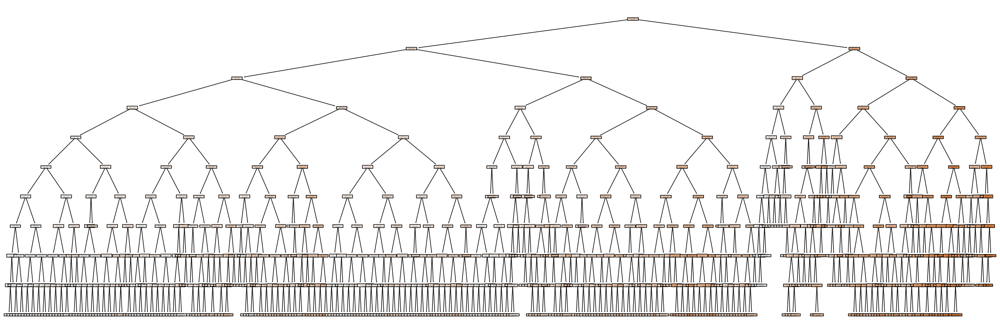

In [45]:
# Visualizing the resultant tree
plt.figure(figsize=(30,10))
tree.plot_tree(best_decision_tree.fit(X_train, y_train), feature_names = X.columns, filled = True,
               rounded = True)
print('Best Decision Tree')

plt.show()

Using grid search to determine that the optimal hyperparameters for the Decision Tree are max_depth=10, min_samples_leaf=4, and min_samples_split=10 provides valuable insights into the model's behavior and performance. The parameter max_depth=10 limits the maximum depth of the tree, preventing it from becoming too complex and overfitting the training data. The min_samples_leaf=4 ensures that each leaf node has at least four samples, which helps in reducing overfitting by requiring a minimum number of samples to create a leaf. Similarly, min_samples_split=10 requires a minimum of ten samples to split an internal node, promoting a simpler and more generalizable model. The resulting Mean Squared Error (MSE) of 3909080852.220673 indicates the average squared difference between the actual and predicted values, reflecting the model's prediction accuracy. 

Feature: sqft, Importance: 0.4379755752524219
Feature: latitude, Importance: 0.30372156128176997
Feature: longitude, Importance: 0.1303339535630786
Feature: year_built, Importance: 0.06702744657975221
Feature: full_baths, Importance: 0.023849734381480442
Feature: parking_garage, Importance: 0.015077926860322832
Feature: lot_sqft, Importance: 0.009816344336491322
Feature: half_baths, Importance: 0.0056616072026410644
Feature: stories, Importance: 0.0019812042294046744
Feature: beds, Importance: 0.0009405583740873714


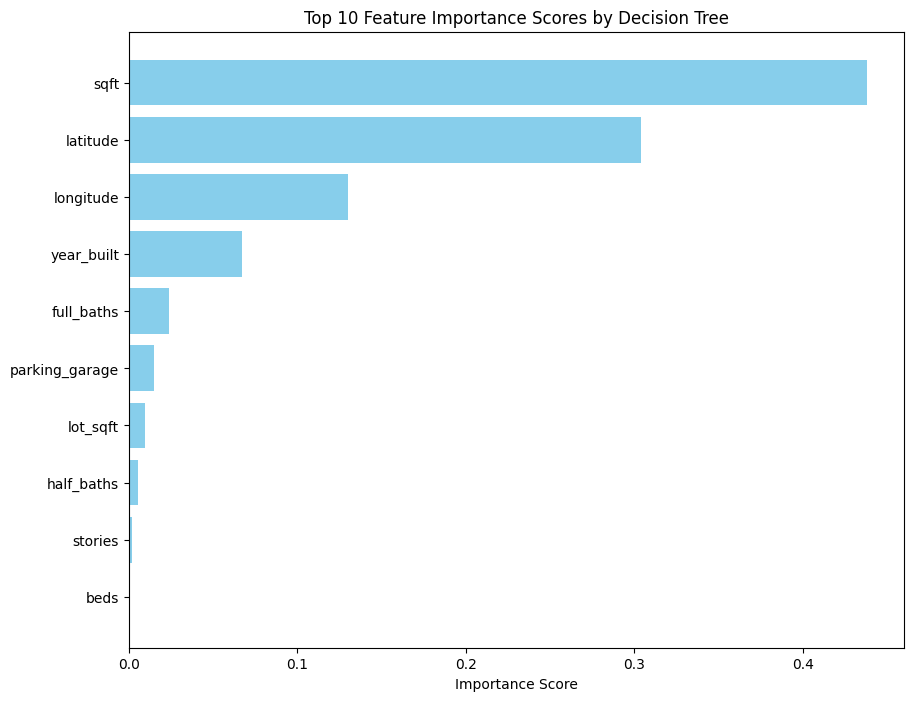

In [46]:
# Get feature importance
feature_importance = best_decision_tree.feature_importances_

# Sort feature importance scores and corresponding feature names in descending order
sorted_features = sorted(zip(X_train.columns, feature_importance), key=lambda x: x[1], reverse=True)

top_features = sorted_features[:10]

# Print feature importance scores and corresponding feature names in descending order
for feature_name, importance_score in top_features:
    print(f"Feature: {feature_name}, Importance: {importance_score}")

feature_names, importance_scores = zip(*top_features)

# Create the horizontal bar chart
plt.figure(figsize=(10, 8))
plt.barh(feature_names, importance_scores, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Top 10 Feature Importance Scores by Decision Tree')
plt.gca().invert_yaxis()  # To have the highest importance score at the top of the chart
plt.show()

### Random Forest

In [47]:
# Define parameters for Random Forest
parameters = {
    'n_estimators': [50, 100, 150],  # Number of trees in the forest
    'max_depth': [5, 10, 12, 15],      # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],   # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]      # Minimum number of samples required to be at a leaf node
}

# Create a Random Forest
random_forest = RandomForestRegressor(random_state=42)

# Build GridSearchCV
gs = GridSearchCV(estimator=random_forest, param_grid=parameters, cv=4)

# Train and fit the model
gs.fit(X_train, y_train)

# See the best parameters
print(gs.best_params_)

# Get the best model
best_random_forest = gs.best_estimator_

# get prediction
y_pred = best_random_forest.predict(X_test)
rf_mse = mean_squared_error(y_test, y_pred)
print("MSE of Decision Tree:", rf_mse)

{'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}
MSE of Decision Tree: 2637618173.4094014



Using grid search to determine that the optimal hyperparameters for the Random Forest are max_depth=15, min_samples_leaf=2, min_samples_split=2, and n_estimators=150 provides valuable insights into the model's behavior and performance. The parameter max_depth=15 limits the maximum depth of each tree in the forest, helping to prevent overfitting by controlling the complexity of the individual trees. The min_samples_leaf=2 ensures that each leaf node has at least two samples, which helps in reducing overfitting and improving the model's generalization. Similarly, min_samples_split=2 allows nodes to split if there are at least two samples, promoting thorough splitting and fine-grained learning within the trees. The n_estimators=150 specifies the number of trees in the forest, which enhances the model's robustness and accuracy by averaging the predictions from multiple trees. The resulting Mean Squared Error (MSE) of 2637618173.4094014 indicates the average squared difference between the actual and predicted values, reflecting the model's prediction accuracy.

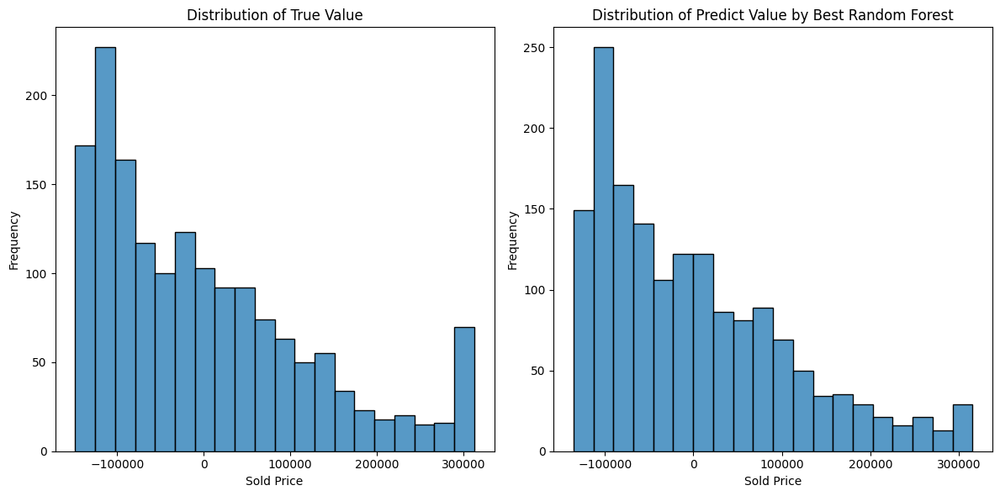

In [48]:
# Plot y_true and y_pred
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.histplot(x= y_test, bins = 20,ax = axs[0])
axs[0].set_title('Distribution of True Value')
axs[0].set_xlabel('Sold Price')
axs[0].set_ylabel('Frequency')

sns.histplot(x= y_pred, bins = 20, ax = axs[1])
axs[1].set_title('Distribution of Predict Value by Best Random Forest')
axs[1].set_xlabel('Sold Price')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

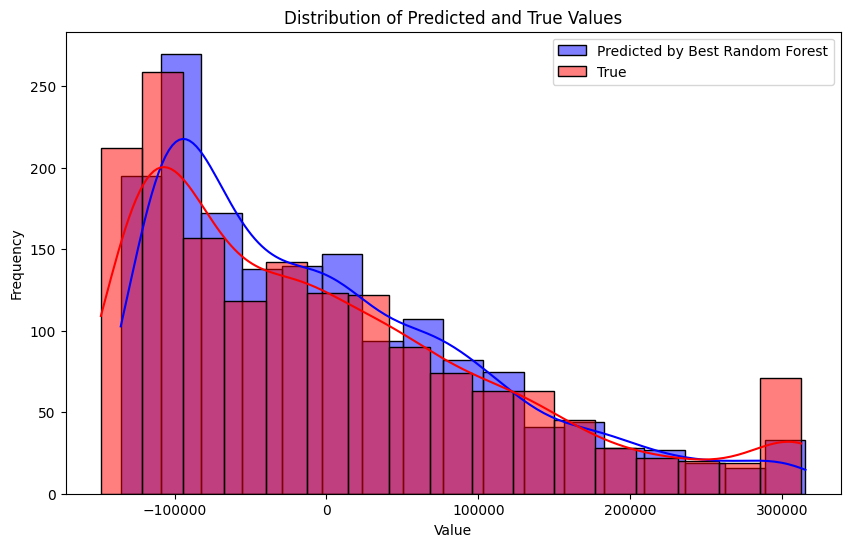

In [49]:
# Plot histograms of predicted and true values
plt.figure(figsize=(10, 6))

# Plot histogram of predicted values
sns.histplot(y_pred, color='blue', kde=True, label='Predicted by Best Random Forest')

# Plot histogram of true values
sns.histplot(y_test, color='red', kde=True, label='True')

plt.title('Distribution of Predicted and True Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

It can be seen that random forest has been significantly improved.

### Neural Networks

In [51]:
# Convert DataFrame to numpy arrays
X_train_array = X_train.to_numpy().astype(np.float32)
y_train_array = y_train.to_numpy().astype(np.float32)
X_test_array = X_test.to_numpy().astype(np.float32)
y_test_array = y_test.to_numpy().astype(np.float32)


# Convert to PyTorch tensors
X_train_torch = torch.tensor(X_train_array)
y_train_torch = torch.tensor(y_train_array)
X_test_torch = torch.tensor(X_test_array)
y_test_torch = torch.tensor(y_test_array)

# Create datasets and dataloaders for the neural network
train_dataset = TensorDataset(X_train_torch, y_train_torch)
test_dataset = TensorDataset(X_test_torch, y_test_torch)

train_loader = DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=64, shuffle=False)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters 
input_size = X_train.shape[1]
hidden_size = 500
output_size = 1
learning_rate = 0.001
num_epochs = 20


# Define the neural network model
class NeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(NeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.sigmoid1 = nn.Sigmoid()
        self.layer2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid2 = nn.Sigmoid()
        self.layer3 = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out = self.layer1(x)
        out = self.sigmoid1(out)
        out = self.layer2(out)
        out = self.sigmoid2(out)
        out = self.layer3(out)
        return out


# Instantiate the model, define the loss function and the optimizer
model = NeuralNetwork(input_size, hidden_size, output_size)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    model.train()
    for i, (inputs, targets) in enumerate(train_loader):
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(-1, 1))
        
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    # Validation step
    model.eval()
    with torch.no_grad():
        val_loss = 0
        for inputs, targets in test_loader:
            outputs = model(inputs)
            val_loss += criterion(outputs, targets.view(-1, 1)).item()

    val_loss /= len(test_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss:.4f}')

# Calculate the MSE on the test data
model.eval()
with torch.no_grad():
    test_loss = 0
    for inputs, targets in test_loader:
        outputs = model(inputs)
        test_loss += criterion(outputs, targets.view(-1, 1)).item()

    test_loss /= len(test_loader)
    print(f'Test MSE: {test_loss:.4f}')

Epoch [1/20], Loss: 14649552896.0000, Validation Loss: 14539115716.9231
Epoch [2/20], Loss: 18684612608.0000, Validation Loss: 14533740071.3846
Epoch [3/20], Loss: 8921296896.0000, Validation Loss: 14528996588.3077
Epoch [4/20], Loss: 14029498368.0000, Validation Loss: 14524549907.6923
Epoch [5/20], Loss: 17862436864.0000, Validation Loss: 14520016502.1538
Epoch [6/20], Loss: 15041477632.0000, Validation Loss: 14515699436.3077
Epoch [7/20], Loss: 8841884672.0000, Validation Loss: 14511131608.6154
Epoch [8/20], Loss: 14920201216.0000, Validation Loss: 14506899810.4615
Epoch [9/20], Loss: 12646310912.0000, Validation Loss: 14502674786.4615
Epoch [10/20], Loss: 17251809280.0000, Validation Loss: 14498596470.1538
Epoch [11/20], Loss: 13905480704.0000, Validation Loss: 14494165858.4615
Epoch [12/20], Loss: 19392028672.0000, Validation Loss: 14490067731.6923
Epoch [13/20], Loss: 15039116288.0000, Validation Loss: 14485845858.4615
Epoch [14/20], Loss: 14295571456.0000, Validation Loss: 144817

This code implements a neural network for regression using PyTorch, designed to predict house prices based on a set of features. The process starts with converting the training and testing datasets from pandas DataFrames to NumPy arrays and then to PyTorch tensors. These tensors are used to create datasets and dataloaders, facilitating batch processing during training.

The neural network model consists of an input layer, two hidden layers, and an output layer, with Sigmoid activation functions applied to the hidden layers to introduce non-linearity. The model is instantiated, and the Mean Squared Error (MSE) loss function and Adam optimizer are defined for training the network.

During training, the model undergoes forward and backward passes to compute the loss and update the weights, respectively. The training loop runs for a specified number of epochs, and after each epoch, the model's performance is evaluated on the validation set to monitor the validation loss. Finally, the model's performance is evaluated on the test set, calculating the test MSE to determine its prediction accuracy. The reported MSE value provides a quantitative measure of the model's prediction accuracy on unseen data.

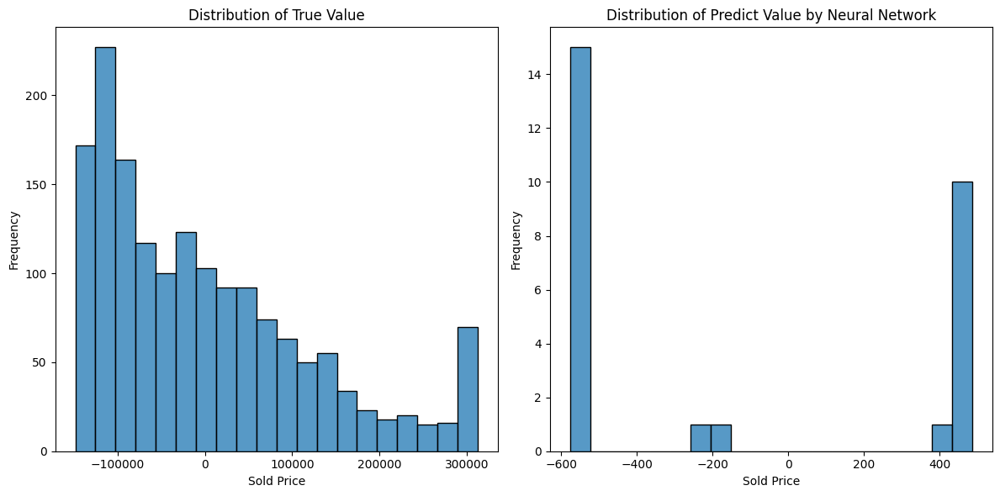

In [52]:
# Convert predicted values to numpy arrays
predicted_np = outputs.numpy().flatten()

# Plot y_true and y_pred
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.histplot(x= y_test_array, bins = 20,ax = axs[0])
axs[0].set_title('Distribution of True Value')
axs[0].set_xlabel('Sold Price')
axs[0].set_ylabel('Frequency')

sns.histplot(x= predicted_np, bins = 20, ax = axs[1])
axs[1].set_title('Distribution of Predict Value by Neural Network')
axs[1].set_xlabel('Sold Price')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

It looks so bed! Let's modify the neural network model parameters to see if the model can be optimized.

Epoch [1/200], Loss: 10414991360.0000, Validation Loss: 8467825506.4615
Epoch [2/200], Loss: 4688665088.0000, Validation Loss: 4959389489.2308
Epoch [3/200], Loss: 3225382656.0000, Validation Loss: 4781144625.2308
Epoch [4/200], Loss: 4010795776.0000, Validation Loss: 4519869922.4615
Epoch [5/200], Loss: 5075278336.0000, Validation Loss: 4396967581.5385
Epoch [6/200], Loss: 4576665088.0000, Validation Loss: 4356656433.2308
Epoch [7/200], Loss: 5066466816.0000, Validation Loss: 4263551394.4615
Epoch [8/200], Loss: 5387592704.0000, Validation Loss: 4192482564.9231
Epoch [9/200], Loss: 3797727232.0000, Validation Loss: 4145445504.0000
Epoch [10/200], Loss: 2809425408.0000, Validation Loss: 4144177196.3077
Epoch [11/200], Loss: 4356728832.0000, Validation Loss: 4053962289.2308
Epoch [12/200], Loss: 5556494336.0000, Validation Loss: 4046419008.0000
Epoch [13/200], Loss: 4074728704.0000, Validation Loss: 3981483288.6154
Epoch [14/200], Loss: 5011501056.0000, Validation Loss: 3925694040.6154


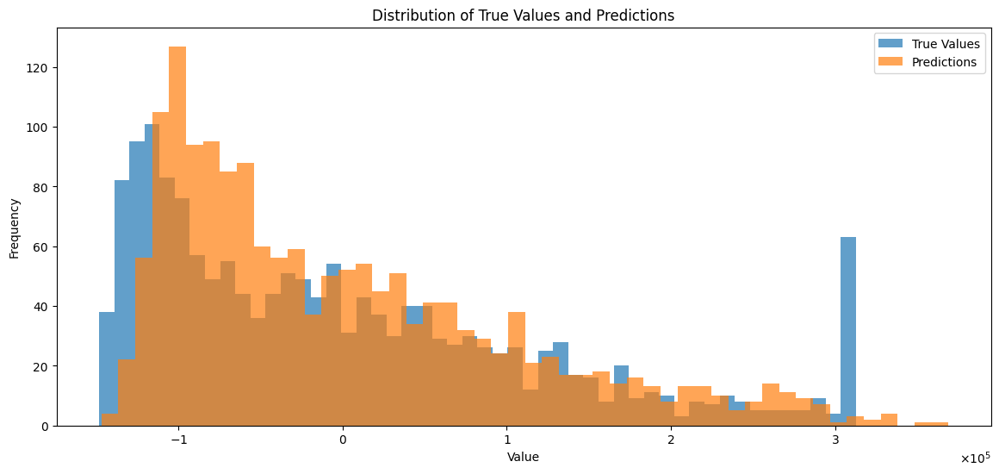

In [54]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters 
input_size = X_train.shape[1]
hidden_size = 500
output_size = 1
learning_rate = 0.001
num_epochs = 200  # Increase the number of epochs for more training

# Define the neural network model with dropout and regularization
class NeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(NeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.layer2 = nn.Linear(hidden_size, hidden_size)
        self.layer3 = nn.Linear(hidden_size, hidden_size)
        self.layer4 = nn.Linear(hidden_size, output_size)
        self.dropout = nn.Dropout(0.5)  # Dropout layer with 50% probability
    
    def forward(self, x):
        out = F.relu(self.layer1(x))
        out = self.dropout(out)
        out = F.relu(self.layer2(out))
        out = self.dropout(out)
        out = F.relu(self.layer3(out))
        out = self.layer4(out)
        return out

# Instantiate the model, define the loss function and the optimizer
model = NeuralNetwork(input_size, hidden_size, output_size).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)  # L2 regularization

# Training loop with validation
for epoch in range(num_epochs):
    model.train()
    for i, (inputs, targets) in enumerate(train_loader):
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(-1, 1))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    model.eval()
    with torch.no_grad():
        val_loss = 0
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            val_loss += criterion(outputs, targets.view(-1, 1)).item()

    val_loss /= len(test_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss:.4f}')

# Calculate the MSE on the test data
model.eval()
with torch.no_grad():
    test_loss = 0
    for inputs, targets in test_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        test_loss += criterion(outputs, targets.view(-1, 1)).item()

    test_loss /= len(test_loader)
    print(f'Test MSE: {test_loss:.4f}')

# Generate predictions and plot histograms
model.eval()
predictions = model(X_test_torch.to(device)).cpu().detach().numpy().flatten()


plt.figure(figsize=(14, 6))

# Plot both histograms on the same axes
plt.hist(y_test_torch.numpy(), bins=50, alpha=0.7, label='True Values')
plt.hist(predictions, bins=50, alpha=0.7, label='Predictions')

# Set x-axis to scientific notation
plt.gca().xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
plt.ticklabel_format(axis='x', style='sci', scilimits=(0, 0))

# Labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of True Values and Predictions')
plt.legend()

plt.show()

The revised neural network model introduces several enhancements aimed at improving performance and robustness. The number of training epochs has been increased from 20 to 200, allowing for more thorough learning. Dropout layers with a probability of 0.5 have been added to reduce overfitting by randomly setting a fraction of input units to zero during training. The network architecture has been expanded to four layers with ReLU activations, and each layer is followed by a dropout layer, capturing more complex patterns. L2 regularization (weight decay) has been added to the optimizer to penalize large weights and promote simpler models. The model and data are now moved to the GPU if available, speeding up training and inference. The training loop includes validation loss computation after each epoch, providing better generalization evaluation. Additionally, the model generates predictions on the test set, with a histogram plot comparing true and predicted values, allowing for visual assessment of prediction quality. These changes collectively aim to enhance the model's generalization performance, robustness, and accuracy by addressing overfitting and leveraging more complex network structures and regularization techniques.

## Transfer Learning

The Random Forest model, with hyperparameters max_depth=15, min_samples_leaf=2, min_samples_split=2, and n_estimators=150, demonstrated a Mean Squared Error (MSE) of 2637618173.4094014, indicating its heightened sensitivity to predicting house prices accurately. This model's ability to capture complex interactions and non-linear relationships within the data has proven effective. Moving forward, I plan to explore transfer learning, leveraging pre-trained models to further enhance prediction performance and potentially reduce training time. This approach will allow me to apply knowledge from related tasks to improve the accuracy and robustness of house price predictions.

Next, we build the random forest model first with data from IL state and explore the generalization ability of the model using data from WI.

### Random Forest

In [60]:
# Input both data sets to pandas
wi_housing = pd.read_csv("WI_housing_price.csv")
il_housing = pd.read_csv("IL_housing_price.csv")
il_housing = il_housing.drop(['property_url', 'county'], axis = 1)
wi_housing = wi_housing.drop(['county', 'property_url'], axis = 1)

# Since we know that there are some outliner in IL data set, let's solve it again by using IQR.
iqr_list = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'stories', 'parking_garage']

# Define IQR to modify outliner
Q1 = il_housing[iqr_list].quantile(0.25)
Q3 = il_housing[iqr_list].quantile(0.75)
IQR = Q3 - Q1

# Set lower bound and uper bond
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

il_housing[iqr_list] = il_housing[iqr_list].clip(lower=lower_bound, upper=upper_bound, axis=1)

# Scaling Data
scaler = StandardScaler()

il_housing_sc = il_housing.copy()
il_housing_sc[numerical_columns] = scaler.fit_transform(il_housing_sc[numerical_columns])

wi_housing_sc = wi_housing.copy()
wi_housing_sc[numerical_columns] = scaler.fit_transform(wi_housing_sc[numerical_columns])

# Get dummpy variable
wi_housing_sc = pd.get_dummies(data=wi_housing_sc, columns = ['style'])
bool_columns = wi_housing_sc.select_dtypes(include=bool).columns
wi_housing_sc[bool_columns] = wi_housing_sc[bool_columns].astype(int)

# Get dummpy variable
il_housing_sc = pd.get_dummies(data=il_housing_sc, columns = ['style'])
bool_columns = il_housing_sc.select_dtypes(include=bool).columns
il_housing_sc[bool_columns] = il_housing_sc[bool_columns].astype(int)

# Check column names
print(il_housing_sc.columns)
print(wi_housing_sc.columns)

Index(['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage',
       'style_CONDOS', 'style_CONDO_TOWNHOME_ROWHOME_COOP', 'style_LAND',
       'style_MOBILE', 'style_MULTI_FAMILY', 'style_SINGLE_FAMILY',
       'style_TOWNHOMES'],
      dtype='object')
Index(['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage',
       'style_MULTI_FAMILY', 'style_SINGLE_FAMILY'],
      dtype='object')


In [56]:
# Define x and Y
y_il = il_housing['sold_price']
X_il = il_housing_sc.drop(['sold_price'], axis=1)

# Define parameters for Random Forest
parameters = {
    'n_estimators': [50, 100, 150],  # Number of trees in the forest
    'max_depth': [5, 10, 12, 15],      # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],   # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]      # Minimum number of samples required to be at a leaf node
}

# Create a Random Forest
random_forest = RandomForestRegressor(random_state=42)
random_forest.fit(X_il, y_il)

RandomForestRegressor(random_state=42)

In [61]:
# There are some styles we need to add into WI_sc manually
wi_housing_sc['style_CONDOS'] = 0
wi_housing_sc['style_TOWNHOMES'] = 0
wi_housing_sc['style_CONDO_TOWNHOME_ROWHOME_COOP'] = 0
wi_housing_sc['style_LAND'] = 0
wi_housing_sc['style_MOBILE'] = 0

new_column_order = ['beds', 'full_baths', 'half_baths', 'sqft', 'year_built', 'sold_price',
       'lot_sqft', 'latitude', 'longitude', 'stories', 'parking_garage',
       'style_CONDOS', 'style_CONDO_TOWNHOME_ROWHOME_COOP', 'style_LAND',
       'style_MOBILE', 'style_MULTI_FAMILY', 'style_SINGLE_FAMILY',
       'style_TOWNHOMES']

# Make sure the order of columns is match with IL one
wi_housing_sc = wi_housing_sc.reindex(columns=new_column_order)

# Define x and Y
y_wi = wi_housing_sc['sold_price']
X_wi = wi_housing_sc.drop(['sold_price'], axis=1)

# Use the trained model to predict the prices for the testing data.
y_wi_pred = random_forest.predict(X_wi)
rf_mse = mean_squared_error(y_wi, y_wi_pred)
print("MSE of Linear Model:", rf_mse)

MSE of Linear Model: 24986175148.46367


### Neural Network

Let's try to build a neural network in an iterative form.

In [63]:
# Divide training set and validation set for IL dataset
X_train, X_val, y_train, y_val = train_test_split(X_il, y_il, test_size=0.2, random_state=1)

# Convert DataFrame to numpy arrays for IL dataset
X_train_array = X_train.to_numpy().astype(np.float32)
y_train_array = y_train.to_numpy().astype(np.float32)
X_val_array = X_val.to_numpy().astype(np.float32)
y_val_array = y_val.to_numpy().astype(np.float32)

# Convert to PyTorch tensors for IL dataset
X_train_torch = torch.tensor(X_train_array)
y_train_torch = torch.tensor(y_train_array)
X_val_torch = torch.tensor(X_val_array)
y_val_torch = torch.tensor(y_val_array)

# Create datasets and dataloaders for the neural network for IL dataset
train_dataset = TensorDataset(X_train_torch, y_train_torch)
val_dataset = TensorDataset(X_val_torch, y_val_torch)

train_loader = DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=64, shuffle=False)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters 
input_size = X_train.shape[1]
hidden_size = 500
output_size = 1
learning_rate = 0.001
num_epochs_IL = 20  # Number of epochs for training on IL dataset

# Define the neural network model
class NeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(NeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.layer2 = nn.Linear(hidden_size, hidden_size)
        self.layer3 = nn.Linear(hidden_size, output_size)
        self.dropout = nn.Dropout(0.5)  # Dropout layer with 50% probability
    
    def forward(self, x):
        out = F.relu(self.layer1(x))
        out = self.dropout(out)
        out = F.relu(self.layer2(out))
        out = self.layer3(out)
        return out

# Instantiate the model, define the loss function and the optimizer for IL dataset
model = NeuralNetwork(input_size, hidden_size, output_size).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=1e-5)  # L2 regularization

# Training loop with validation for IL dataset
for epoch in range(num_epochs_IL):
    model.train()
    for i, (inputs, targets) in enumerate(train_loader):
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(-1, 1))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    model.eval()
    with torch.no_grad():
        val_loss_IL = 0
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            val_loss_IL += criterion(outputs, targets.view(-1, 1)).item()

    val_loss_IL /= len(val_loader)
    print(f'Epoch [{epoch+1}/{num_epochs_IL}], Loss: {loss.item():.4f}, Validation Loss for IL: {val_loss_IL:.4f}')

Epoch [1/20], Loss: 27771025408.0000, Validation Loss for IL: 37422380425.8462
Epoch [2/20], Loss: 22358546432.0000, Validation Loss for IL: 30398144433.2308
Epoch [3/20], Loss: 17451327488.0000, Validation Loss for IL: 15414285587.6923
Epoch [4/20], Loss: 5498769920.0000, Validation Loss for IL: 7527073122.4615
Epoch [5/20], Loss: 5031138816.0000, Validation Loss for IL: 6387529314.4615
Epoch [6/20], Loss: 4529726464.0000, Validation Loss for IL: 6052665137.2308
Epoch [7/20], Loss: 4497114624.0000, Validation Loss for IL: 5910297590.1538
Epoch [8/20], Loss: 4810240000.0000, Validation Loss for IL: 5818452470.1538
Epoch [9/20], Loss: 4430995968.0000, Validation Loss for IL: 5768056448.0000
Epoch [10/20], Loss: 4360177152.0000, Validation Loss for IL: 5702417053.5385
Epoch [11/20], Loss: 5769296896.0000, Validation Loss for IL: 5654842397.5385
Epoch [12/20], Loss: 4986773504.0000, Validation Loss for IL: 5589428214.1538
Epoch [13/20], Loss: 5181861376.0000, Validation Loss for IL: 55667

### Iteration

In [64]:
# Divide training set and validation set for WI dataset
X_train_WI, X_val_WI, y_train_WI, y_val_WI = train_test_split(X_wi, y_wi, test_size=0.2, random_state=1)

# Convert DataFrame to numpy arrays for WI dataset
X_train_array_WI = X_train_WI.to_numpy().astype(np.float32)
y_train_array_WI = y_train_WI.to_numpy().astype(np.float32)
X_val_array_WI = X_val_WI.to_numpy().astype(np.float32)
y_val_array_WI = y_val_WI.to_numpy().astype(np.float32)

# Convert to PyTorch tensors for WI dataset
X_train_torch_WI = torch.tensor(X_train_array_WI)
y_train_torch_WI = torch.tensor(y_train_array_WI)
X_val_torch_WI = torch.tensor(X_val_array_WI)
y_val_torch_WI = torch.tensor(y_val_array_WI)

# Create datasets and dataloaders for the neural network for WI dataset
train_dataset_WI = TensorDataset(X_train_torch_WI, y_train_torch_WI)
val_dataset_WI = TensorDataset(X_val_torch_WI, y_val_torch_WI)

train_loader_WI = DataLoader(dataset=train_dataset_WI, batch_size=64, shuffle=True)
val_loader_WI = DataLoader(dataset=val_dataset_WI, batch_size=64, shuffle=False)

# Hyper-parameters for fine-tuning on WI dataset
num_epochs_WI = 5  # Number of epochs for fine-tuning on WI dataset

# Fine-tuning loop with validation for WI dataset
for epoch in range(num_epochs_WI):
    model.train()
    for i, (inputs, targets) in enumerate(train_loader_WI):
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(-1, 1))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    model.eval()
    with torch.no_grad():
        val_loss_WI = 0
        for inputs, targets in val_loader_WI:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            val_loss_WI += criterion(outputs, targets.view(-1, 1)).item()

    val_loss_WI /= len(val_loader_WI)
    print(f'Epoch [{epoch+1}/{num_epochs_WI}], Loss: {loss.item():.4f}, Validation Loss for WI: {val_loss_WI:.4f}')

# Evaluate the model on WI dataset
model.eval()
with torch.no_grad():
    test_loss_WI = 0
    for inputs, targets in val_loader_WI:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        test_loss_WI += criterion(outputs, targets.view(-1, 1)).item()

    test_loss_WI /= len(val_loader_WI)
    print(f'Test MSE for WI: {test_loss_WI:.4f}')

# Generate predictions and plot histograms for WI dataset
model.eval()
predictions_WI = model(X_val_torch_WI.to(device)).cpu().detach().numpy().flatten()

Epoch [1/5], Loss: 16227524608.0000, Validation Loss for WI: 20137371648.0000
Epoch [2/5], Loss: 16205810688.0000, Validation Loss for WI: 20064851968.0000
Epoch [3/5], Loss: 15702681600.0000, Validation Loss for WI: 19949793280.0000
Epoch [4/5], Loss: 15815993344.0000, Validation Loss for WI: 19798556672.0000
Epoch [5/5], Loss: 16572664832.0000, Validation Loss for WI: 19616575488.0000
Test MSE for WI: 19616575488.0000


This code performs training and validation of a neural network model for house price prediction using datasets from Illinois (IL) and Wisconsin (WI). Initially, the IL dataset is split into training and validation sets, converted to NumPy arrays, and then to PyTorch tensors. PyTorch TensorDataset and DataLoader objects are created to manage batching and shuffling of the data. The neural network, consisting of three linear layers with ReLU activations and dropout for regularization, is trained for 20 epochs on the IL dataset using the Adam optimizer with L2 regularization. Validation loss is evaluated and printed after each epoch. Subsequently, the WI dataset undergoes a similar data preparation process. The pre-trained model from the IL dataset is fine-tuned for 5 epochs on the WI dataset, with validation loss tracked and printed. After fine-tuning, the model's performance is assessed on the WI validation set, with the test Mean Squared Error (MSE) printed. Predictions are generated for the WI validation set, ready for further analysis. This transfer learning approach leverages the knowledge gained from the IL dataset to enhance the model's performance and generalization on the WI dataset.